In [2]:
# Import Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import string
import spacy

from matplotlib.pyplot import imread
from wordcloud import WordCloud, STOPWORDS
%matplotlib inline

In [3]:
# Import extracted amazon reviews Dataset "extract_reviews_fire_bolt.csv"
reviews=pd.read_csv('extract_reviews_fire_bolt.csv')
reviews

,stars,comment
0,4.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n Writing this revie...
1,4.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n I am writing this ...
2,4.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n Touch is not much ...
3,4.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n First of all desig...
4,4.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n Touch is not much ...
...,...,...
1587,4.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n First of all desig...
1588,4.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n Touch is not much ...
1589,4.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n I have found the t...
1590,4.0 out of 5 stars,"\n\n\n\n\n\n\n\n \n \n Awesome product, d..."


# Text Preprocessing

In [4]:
reviews=[comment.strip() for comment in reviews.comment] # remove both the leading and the trailing characters
reviews=[comment for comment in reviews if comment] # removes empty strings, because they are considered in Python as False
reviews[0:10]

["Writing this review after gifting if to my brother and using for 1 hour. Watch touch screen is awesome, no lag and smooth running. Charging is quite fast. 20 minutes and 20-60% charge. Watch is good looking too. I haven't test the sleep tracking yet. But my bro will surely tell the sleep tracking experience and I'll edit this review. The only bad (actually worst) thing about this watch is that the sensors are fully fake. I tested it on a table and it shows that the table has 78 bpm. If you wear it you will also get the same result. Watch is quite good, you could go for it if you are not looking for a heart beat, SpO2 sensing watch because they are worst.\n  \nRead more",
 'I am writing this detailed review after using this product for a week:Build Quality: It is metal body but not the pure metal material, overall build quality is good.Screen: Amazing experience with screen, even it is not Amoled display but you will not feel the need as brightness is sufficient when wants to use in S

In [5]:
# Joining the list into one string/text
reviews_text=' '.join(reviews)
reviews_text

"Writing this review after gifting if to my brother and using for 1 hour. Watch touch screen is awesome, no lag and smooth running. Charging is quite fast. 20 minutes and 20-60% charge. Watch is good looking too. I haven't test the sleep tracking yet. But my bro will surely tell the sleep tracking experience and I'll edit this review. The only bad (actually worst) thing about this watch is that the sensors are fully fake. I tested it on a table and it shows that the table has 78 bpm. If you wear it you will also get the same result. Watch is quite good, you could go for it if you are not looking for a heart beat, SpO2 sensing watch because they are worst.\n  \nRead more I am writing this detailed review after using this product for a week:Build Quality: It is metal body but not the pure metal material, overall build quality is good.Screen: Amazing experience with screen, even it is not Amoled display but you will not feel the need as brightness is sufficient when wants to use in Sunlig

In [6]:
# Remove Punctuations 
no_punc_text=reviews_text.translate(str.maketrans('','',string.punctuation))
no_punc_text

'Writing this review after gifting if to my brother and using for 1 hour Watch touch screen is awesome no lag and smooth running Charging is quite fast 20 minutes and 2060 charge Watch is good looking too I havent test the sleep tracking yet But my bro will surely tell the sleep tracking experience and Ill edit this review The only bad actually worst thing about this watch is that the sensors are fully fake I tested it on a table and it shows that the table has 78 bpm If you wear it you will also get the same result Watch is quite good you could go for it if you are not looking for a heart beat SpO2 sensing watch because they are worst\n  \nRead more I am writing this detailed review after using this product for a weekBuild Quality It is metal body but not the pure metal material overall build quality is goodScreen Amazing experience with screen even it is not Amoled display but you will not feel the need as brightness is sufficient when wants to use in Sunlight Touch is very smooth bu

In [7]:
# Tokenization
import nltk
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [8]:
from nltk import word_tokenize
text_tokens=word_tokenize(no_punc_text)
print(text_tokens[0:50])

['Writing', 'this', 'review', 'after', 'gifting', 'if', 'to', 'my', 'brother', 'and', 'using', 'for', '1', 'hour', 'Watch', 'touch', 'screen', 'is', 'awesome', 'no', 'lag', 'and', 'smooth', 'running', 'Charging', 'is', 'quite', 'fast', '20', 'minutes', 'and', '2060', 'charge', 'Watch', 'is', 'good', 'looking', 'too', 'I', 'havent', 'test', 'the', 'sleep', 'tracking', 'yet', 'But', 'my', 'bro', 'will', 'surely']


In [9]:
len(text_tokens)

185667

In [10]:
# Remove stopwords
from nltk.corpus import stopwords
my_stop_words=stopwords.words('english')

sw_list=['I','The','It','A']
my_stop_words.extend(sw_list)

no_stop_tokens=[word for word in text_tokens if not word in my_stop_words]
print(no_stop_tokens)

['Writing', 'review', 'gifting', 'brother', 'using', '1', 'hour', 'Watch', 'touch', 'screen', 'awesome', 'lag', 'smooth', 'running', 'Charging', 'quite', 'fast', '20', 'minutes', '2060', 'charge', 'Watch', 'good', 'looking', 'havent', 'test', 'sleep', 'tracking', 'yet', 'But', 'bro', 'surely', 'tell', 'sleep', 'tracking', 'experience', 'Ill', 'edit', 'review', 'bad', 'actually', 'worst', 'thing', 'watch', 'sensors', 'fully', 'fake', 'tested', 'table', 'shows', 'table', '78', 'bpm', 'If', 'wear', 'also', 'get', 'result', 'Watch', 'quite', 'good', 'could', 'go', 'looking', 'heart', 'beat', 'SpO2', 'sensing', 'watch', 'worst', 'Read', 'writing', 'detailed', 'review', 'using', 'product', 'weekBuild', 'Quality', 'metal', 'body', 'pure', 'metal', 'material', 'overall', 'build', 'quality', 'goodScreen', 'Amazing', 'experience', 'screen', 'even', 'Amoled', 'display', 'feel', 'need', 'brightness', 'sufficient', 'wants', 'use', 'Sunlight', 'Touch', 'smooth', 'get', 'scratches', 'screen', 'easily

In [11]:
# Normalize the data
lower_words=[comment.lower() for comment in no_stop_tokens]
print(lower_words)

['writing', 'review', 'gifting', 'brother', 'using', '1', 'hour', 'watch', 'touch', 'screen', 'awesome', 'lag', 'smooth', 'running', 'charging', 'quite', 'fast', '20', 'minutes', '2060', 'charge', 'watch', 'good', 'looking', 'havent', 'test', 'sleep', 'tracking', 'yet', 'but', 'bro', 'surely', 'tell', 'sleep', 'tracking', 'experience', 'ill', 'edit', 'review', 'bad', 'actually', 'worst', 'thing', 'watch', 'sensors', 'fully', 'fake', 'tested', 'table', 'shows', 'table', '78', 'bpm', 'if', 'wear', 'also', 'get', 'result', 'watch', 'quite', 'good', 'could', 'go', 'looking', 'heart', 'beat', 'spo2', 'sensing', 'watch', 'worst', 'read', 'writing', 'detailed', 'review', 'using', 'product', 'weekbuild', 'quality', 'metal', 'body', 'pure', 'metal', 'material', 'overall', 'build', 'quality', 'goodscreen', 'amazing', 'experience', 'screen', 'even', 'amoled', 'display', 'feel', 'need', 'brightness', 'sufficient', 'wants', 'use', 'sunlight', 'touch', 'smooth', 'get', 'scratches', 'screen', 'easily

In [12]:
# Stemming (Optional)
from nltk.stem import PorterStemmer
ps=PorterStemmer()
stemmed_tokens=[ps.stem(word) for word in lower_words]
print(stemmed_tokens)

['write', 'review', 'gift', 'brother', 'use', '1', 'hour', 'watch', 'touch', 'screen', 'awesom', 'lag', 'smooth', 'run', 'charg', 'quit', 'fast', '20', 'minut', '2060', 'charg', 'watch', 'good', 'look', 'havent', 'test', 'sleep', 'track', 'yet', 'but', 'bro', 'sure', 'tell', 'sleep', 'track', 'experi', 'ill', 'edit', 'review', 'bad', 'actual', 'worst', 'thing', 'watch', 'sensor', 'fulli', 'fake', 'test', 'tabl', 'show', 'tabl', '78', 'bpm', 'if', 'wear', 'also', 'get', 'result', 'watch', 'quit', 'good', 'could', 'go', 'look', 'heart', 'beat', 'spo2', 'sens', 'watch', 'worst', 'read', 'write', 'detail', 'review', 'use', 'product', 'weekbuild', 'qualiti', 'metal', 'bodi', 'pure', 'metal', 'materi', 'overal', 'build', 'qualiti', 'goodscreen', 'amaz', 'experi', 'screen', 'even', 'amol', 'display', 'feel', 'need', 'bright', 'suffici', 'want', 'use', 'sunlight', 'touch', 'smooth', 'get', 'scratch', 'screen', 'easili', 'wakeup', 'function', 'work', 'initi', 'work', 'pretti', 'well', 'resettin

In [13]:
# Lemmatization
nlp=spacy.load('en_core_web_sm')
doc=nlp(' '.join(lower_words))
print(doc)

writing review gifting brother using 1 hour watch touch screen awesome lag smooth running charging quite fast 20 minutes 2060 charge watch good looking havent test sleep tracking yet but bro surely tell sleep tracking experience ill edit review bad actually worst thing watch sensors fully fake tested table shows table 78 bpm if wear also get result watch quite good could go looking heart beat spo2 sensing watch worst read writing detailed review using product weekbuild quality metal body pure metal material overall build quality goodscreen amazing experience screen even amoled display feel need brightness sufficient wants use sunlight touch smooth get scratches screen easily wakeup function working initially worked pretty well resettingaccuracy most smartwatches measure ghost reading overall accuracy good budgetbattery average battery back 67days battery backup 23 days using calling function moderately takes 15 hour full chargebluetooth calling works far better expectations mic speaker

In [14]:
lemmas=[token.lemma_ for token in doc]
print(lemmas)

['write', 'review', 'gifting', 'brother', 'use', '1', 'hour', 'watch', 'touch', 'screen', 'awesome', 'lag', 'smooth', 'running', 'charge', 'quite', 'fast', '20', 'minute', '2060', 'charge', 'watch', 'good', 'looking', 'have', 'not', 'test', 'sleep', 'track', 'yet', 'but', 'bro', 'surely', 'tell', 'sleep', 'track', 'experience', 'ill', 'edit', 'review', 'bad', 'actually', 'bad', 'thing', 'watch', 'sensor', 'fully', 'fake', 'test', 'table', 'show', 'table', '78', 'bpm', 'if', 'wear', 'also', 'get', 'result', 'watch', 'quite', 'good', 'could', 'go', 'look', 'heart', 'beat', 'spo2', 'sense', 'watch', 'worst', 'read', 'write', 'detailed', 'review', 'use', 'product', 'weekbuild', 'quality', 'metal', 'body', 'pure', 'metal', 'material', 'overall', 'build', 'quality', 'goodscreen', 'amazing', 'experience', 'screen', 'even', 'amole', 'display', 'feel', 'need', 'brightness', 'sufficient', 'want', 'use', 'sunlight', 'touch', 'smooth', 'get', 'scratch', 'screen', 'easily', 'wakeup', 'function', 'w

In [15]:
clean_reviews=' '.join(lemmas)
clean_reviews

'write review gifting brother use 1 hour watch touch screen awesome lag smooth running charge quite fast 20 minute 2060 charge watch good looking have not test sleep track yet but bro surely tell sleep track experience ill edit review bad actually bad thing watch sensor fully fake test table show table 78 bpm if wear also get result watch quite good could go look heart beat spo2 sense watch worst read write detailed review use product weekbuild quality metal body pure metal material overall build quality goodscreen amazing experience screen even amole display feel need brightness sufficient want use sunlight touch smooth get scratch screen easily wakeup function work initially work pretty well resettingaccuracy most smartwatche measure ghost read overall accuracy good budgetbattery average battery back 67days battery backup 23 day use call function moderately take 15 hour full chargebluetooth calling work far well expectation mic speaker good talk without background disturbance person 

# Feature Extaction
# 1. Using CountVectorizer

In [16]:
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()
reviewscv=cv.fit_transform(lemmas)

In [17]:
print(cv.vocabulary_)

{'write': 252, 'review': 180, 'gifting': 101, 'brother': 48, 'use': 234, 'hour': 113, 'watch': 241, 'touch': 228, 'screen': 188, 'awesome': 30, 'lag': 122, 'smooth': 203, 'running': 184, 'charge': 56, 'quite': 170, 'fast': 87, '20': 1, 'minute': 140, '2060': 2, 'good': 104, 'looking': 130, 'have': 108, 'not': 153, 'test': 220, 'sleep': 200, 'track': 229, 'yet': 254, 'but': 52, 'bro': 47, 'surely': 215, 'tell': 219, 'experience': 83, 'ill': 115, 'edit': 76, 'bad': 34, 'actually': 13, 'thing': 224, 'sensor': 194, 'fully': 97, 'fake': 85, 'table': 216, 'show': 195, '78': 5, 'bpm': 45, 'if': 114, 'wear': 242, 'also': 20, 'get': 99, 'result': 179, 'could': 63, 'go': 103, 'look': 129, 'heart': 110, 'beat': 38, 'spo2': 208, 'sense': 193, 'worst': 249, 'read': 173, 'detailed': 69, 'product': 166, 'weekbuild': 243, 'quality': 169, 'metal': 137, 'body': 44, 'pure': 168, 'material': 134, 'overall': 157, 'build': 51, 'goodscreen': 106, 'amazing': 22, 'even': 78, 'amole': 23, 'display': 71, 'feel':

In [20]:
print(cv.get_feature_names()[50:250])

['budgetbattery', 'build', 'but', 'call', 'calling', 'change', 'charge', 'chargebluetooth', 'clear', 'come', 'compare', 'contact', 'cool', 'could', 'datum', 'day', 'decent', 'delay', 'designand', 'detailed', 'dial', 'display', 'disturbance', 'do', 'download', 'easily', 'edit', 'etc', 'even', 'excellent', 'except', 'expect', 'expectation', 'experience', 'face', 'fake', 'far', 'fast', 'favourite', 'feature', 'feel', 'find', 'first', 'fix', 'flaw', 'friendly', 'full', 'fully', 'function', 'get', 'ghost', 'gifting', 'give', 'go', 'good', 'goodgood', 'goodscreen', 'hand', 'have', 'hear', 'heart', 'heavy', 'highly', 'hour', 'if', 'ill', 'improve', 'improvedi', 'in', 'initially', 'interm', 'issue', 'lag', 'leave', 'less', 'life', 'light', 'like', 'list', 'look', 'looking', 'loud', 'loudly', 'love', 'material', 'mean', 'measure', 'metal', 'mic', 'minimum', 'minute', 'miss', 'mode', 'moderately', 'money', 'mood', 'most', 'motion', 'move', 'much', 'need', 'nice', 'no', 'not', 'notification', 'ok

In [21]:
print(reviewscv.toarray()[50:250])

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [22]:
print(reviewscv.toarray().shape)

(102684, 255)


# 2. CountVectorizer with N-grams (Bigrams & Trigrams)

In [23]:
cv_ngram_range=CountVectorizer(analyzer='word',ngram_range=(1,3),max_features=100)
bow_matrix_ngram=cv_ngram_range.fit_transform(lemmas)

In [24]:
print(cv_ngram_range.get_feature_names())
print(bow_matrix_ngram.toarray())

['affordable', 'also', 'amazing', 'and', 'awesome', 'bad', 'battery', 'big', 'bluetooth', 'budget', 'build', 'call', 'change', 'charge', 'clear', 'come', 'compare', 'datum', 'day', 'delay', 'display', 'do', 'etc', 'except', 'expect', 'experience', 'face', 'feature', 'feel', 'find', 'flaw', 'function', 'get', 'go', 'good', 'hour', 'in', 'lag', 'life', 'light', 'look', 'loudly', 'metal', 'mic', 'money', 'mood', 'much', 'not', 'notification', 'ok', 'option', 'overall', 'personally', 'pretty', 'price', 'product', 'public', 'pure', 'quality', 'quite', 'range', 'read', 'review', 'ring', 'screen', 'seeing', 'sensor', 'silent', 'since', 'size', 'sleep', 'smooth', 'speaker', 'spo2', 'strap', 'sufficient', 'sunlight', 'surely', 'table', 'take', 'talk', 'tell', 'test', 'that', 'touch', 'track', 'try', 'use', 'value', 'wallpaper', 'watch', 'wear', 'well', 'when', 'without', 'work', 'workingcustomizable', 'wow', 'write', 'yes']
[[0 0 0 ... 0 1 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 .

# 3. TF-IDF Vectorizer

In [25]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidfv_ngram_max_features=TfidfVectorizer(norm='l2',analyzer='word',ngram_range=(1,3),max_features=500)
tfidf_matrix_ngram=tfidfv_ngram_max_features.fit_transform(lemmas)


In [26]:
print(tfidfv_ngram_max_features.get_feature_names())
print(tfidf_matrix_ngram.toarray())

['15', '20', '2060', '23', '67days', '78', '8590', 'able', 'absolutely', 'access', 'accord', 'accuracy', 'accurate', 'actually', 'add', 'affordable', 'after', 'all', 'allow', 'almost', 'also', 'always', 'amazing', 'amole', 'and', 'another', 'app', 'applythere', 'automatically', 'average', 'awesome', 'back', 'background', 'backup', 'bad', 'battary', 'battery', 'be', 'beat', 'beautiful', 'betray', 'big', 'bit', 'bluetooth', 'body', 'bpm', 'brightness', 'bro', 'brother', 'budget', 'budgetbattery', 'build', 'but', 'call', 'calling', 'change', 'charge', 'chargebluetooth', 'clear', 'come', 'compare', 'contact', 'cool', 'could', 'datum', 'day', 'decent', 'delay', 'designand', 'detailed', 'dial', 'display', 'disturbance', 'do', 'download', 'easily', 'edit', 'etc', 'even', 'excellent', 'except', 'expect', 'expectation', 'experience', 'face', 'fake', 'far', 'fast', 'favourite', 'feature', 'feel', 'find', 'first', 'fix', 'flaw', 'friendly', 'full', 'fully', 'function', 'get', 'ghost', 'gifting', 

# Generate Word Cloud

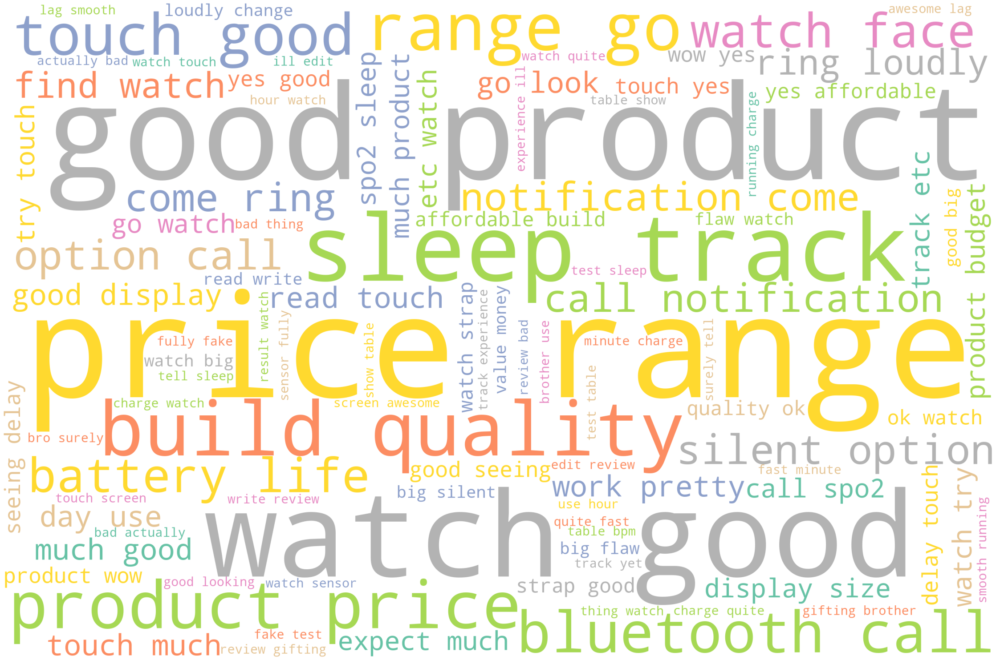

In [27]:
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.axis('off')

# Generate word cloud

STOPWORDS.add('Pron')
wordcloud=WordCloud(width=3000,height=2000,background_color='white',max_words=100,
                   colormap='Set2',stopwords=STOPWORDS).generate(clean_reviews)
plot_cloud(wordcloud)

# Named Entity Recognition (NER)

In [28]:
# Parts of speech (POS) tagging
nlp=spacy.load('en_core_web_sm')

one_block=clean_reviews
doc_block=nlp(one_block)
spacy.displacy.render(doc_block,style='ent',jupyter=True)

In [29]:
for token in doc_block[100:200]:
    print(token,token.pos_)

sunlight NOUN
touch VERB
smooth ADJ
get VERB
scratch NOUN
screen NOUN
easily ADV
wakeup VERB
function NOUN
work NOUN
initially ADV
work VERB
pretty ADV
well ADV
resettingaccuracy NOUN
most ADJ
smartwatche NOUN
measure NOUN
ghost NOUN
read VERB
overall ADJ
accuracy NOUN
good ADJ
budgetbattery NOUN
average ADJ
battery NOUN
back ADV
67days NUM
battery NOUN
backup NOUN
23 NUM
day NOUN
use NOUN
call NOUN
function NOUN
moderately ADV
take VERB
15 NUM
hour NOUN
full ADJ
chargebluetooth NOUN
calling VERB
work NOUN
far ADV
well ADV
expectation NOUN
mic ADJ
speaker NOUN
good ADJ
talk NOUN
without ADP
background NOUN
disturbance NOUN
person NOUN
side NOUN
also ADV
hear VERB
clear ADJ
soundoverall NOUN
good ADJ
product NOUN
price NOUN
range NOUN
go VERB
look VERB
budget NOUN
friendly ADJ
round ADJ
dial NOUN
watch NOUN
read VERB
touch VERB
much ADJ
good ADJ
display NOUN
size NOUN
improvedi PROPN
ts ADP
good ADJ
product NOUN
budget NOUN
do AUX
not PART
expect VERB
much ADJ
product NOUN
price NOUN
ra

In [30]:
# Filtering the nouns and verbs only
nouns_verbs=[token.text for token in doc_block if token.pos_ in ('NOUN','VERB')]
print(nouns_verbs[100:200])

['hear', 'soundoverall', 'product', 'price', 'range', 'go', 'look', 'budget', 'dial', 'watch', 'read', 'touch', 'display', 'size', 'product', 'budget', 'expect', 'product', 'price', 'range', 'get', 'call', 'sleep', 'track', 'watch', 'price', 'range', 'go', 'watch', 'try', 'touch', 'seeing', 'delay', 'touch', 'product', 'build', 'quality', 'watch', 'strap', 'feel', 'wear', 'wrist', 'speaker', 'talk', 'room', 'read', 'designand', 'build', 'quality', 'watch', 'price', 'rangesleep', 'screen', 'voice', 'feature', 'goodgood', 'battery', 'life', 'day', 'use', 'theatre', 'mode', 'mood', 'bluetooth', 'call', 'mood', 'day', 'watch', 'face', 'miss', 'watch', 'face', 'storage', 'option', 'download', 'option', 'call', 'call', 'notification', 'come', 'ring', 'change', 'contact', 'list', 'fix', 'software', 'update', 'product', 'value', 'money', 'touch', 'display', 'size', 'improve', 'product', 'budget', 'expect', 'product', 'price', 'range']


In [31]:
# Counting the noun & verb tokens
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()

X=cv.fit_transform(nouns_verbs)
sum_words=X.sum(axis=0)

words_freq=[(word,sum_words[0,idx]) for word,idx in cv.vocabulary_.items()]
words_freq=sorted(words_freq,key=lambda x: x[1],reverse=True)

wd_df=pd.DataFrame(words_freq)
wd_df.columns=['word','count']
wd_df[0:10] # viewing top ten results

,word,count
0,watch,4776
1,touch,1990
2,product,1990
3,call,1990
4,read,1497
5,price,1393
6,range,1393
7,use,1380
8,screen,995
9,quality,995


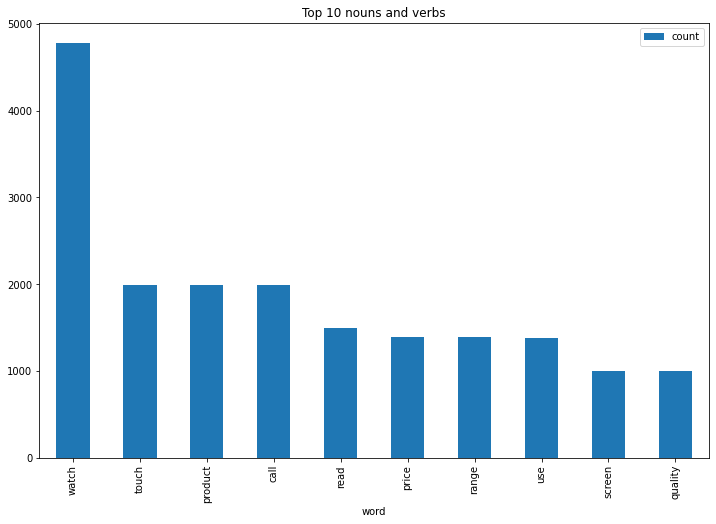

In [32]:
# Visualizing results (Barchart for top 10 nouns + verbs)
wd_df[0:10].plot.bar(x='word',figsize=(12,8),title='Top 10 nouns and verbs');

# Emotion Mining - Sentiment Analysis

In [33]:
from nltk import tokenize
sentences=tokenize.sent_tokenize(' '.join(reviews))
sentences

['Writing this review after gifting if to my brother and using for 1 hour.',
 'Watch touch screen is awesome, no lag and smooth running.',
 'Charging is quite fast.',
 '20 minutes and 20-60% charge.',
 'Watch is good looking too.',
 "I haven't test the sleep tracking yet.",
 "But my bro will surely tell the sleep tracking experience and I'll edit this review.",
 'The only bad (actually worst) thing about this watch is that the sensors are fully fake.',
 'I tested it on a table and it shows that the table has 78 bpm.',
 'If you wear it you will also get the same result.',
 'Watch is quite good, you could go for it if you are not looking for a heart beat, SpO2 sensing watch because they are worst.',
 'Read more I am writing this detailed review after using this product for a week:Build Quality: It is metal body but not the pure metal material, overall build quality is good.Screen: Amazing experience with screen, even it is not Amoled display but you will not feel the need as brightness i

In [34]:
sent_df=pd.DataFrame(sentences,columns=['sentence'])
sent_df

,sentence
0,Writing this review after gifting if to my bro...
1,"Watch touch screen is awesome, no lag and smoo..."
2,Charging is quite fast.
3,20 minutes and 20-60% charge.
4,Watch is good looking too.
...,...
11339,There are no lagging issues.
11340,The touch response is were good.
11341,Speaker is very loud.
11342,Except the wallpapers all other features are g...


In [36]:
# Emotion Lexicon - Affin
affin=pd.read_csv('Afinn.csv',sep=',',encoding='Latin-1')
affin

,word,value
0,abandon,-2
1,abandoned,-2
2,abandons,-2
3,abducted,-2
4,abduction,-2
...,...,...
2472,yucky,-2
2473,yummy,3
2474,zealot,-2
2475,zealots,-2


In [37]:
affinity_scores=affin.set_index('word')['value'].to_dict()
affinity_scores

{'abandon': -2,
 'abandoned': -2,
 'abandons': -2,
 'abducted': -2,
 'abduction': -2,
 'abductions': -2,
 'abhor': -3,
 'abhorred': -3,
 'abhorrent': -3,
 'abhors': -3,
 'abilities': 2,
 'ability': 2,
 'aboard': 1,
 'absentee': -1,
 'absentees': -1,
 'absolve': 2,
 'absolved': 2,
 'absolves': 2,
 'absolving': 2,
 'absorbed': 1,
 'abuse': -3,
 'abused': -3,
 'abuses': -3,
 'abusive': -3,
 'accept': 1,
 'accepted': 1,
 'accepting': 1,
 'accepts': 1,
 'accident': -2,
 'accidental': -2,
 'accidentally': -2,
 'accidents': -2,
 'accomplish': 2,
 'accomplished': 2,
 'accomplishes': 2,
 'accusation': -2,
 'accusations': -2,
 'accuse': -2,
 'accused': -2,
 'accuses': -2,
 'accusing': -2,
 'ache': -2,
 'achievable': 1,
 'aching': -2,
 'acquit': 2,
 'acquits': 2,
 'acquitted': 2,
 'acquitting': 2,
 'acrimonious': -3,
 'active': 1,
 'adequate': 1,
 'admire': 3,
 'admired': 3,
 'admires': 3,
 'admiring': 3,
 'admit': -1,
 'admits': -1,
 'admitted': -1,
 'admonish': -2,
 'admonished': -2,
 'adopt': 

In [38]:
# Custom function: score each word in a sentence in lemmatised form, but calculate the score for the whole original sentence
nlp=spacy.load('en_core_web_sm')
sentiment_lexicon=affinity_scores

def calculate_sentiment(text:str=None):
    sent_score=0
    if text:
        sentence=nlp(text)
        for word in sentence:
            sent_score+=sentiment_lexicon.get(word.lemma_,0)
    return sent_score

In [39]:
# manual testing
calculate_sentiment(text='good service')

3

In [40]:
# Calculating sentiment value for each sentence
sent_df['sentiment_value']=sent_df['sentence'].apply(calculate_sentiment)
sent_df['sentiment_value']

0        2
1        2
2        0
3        0
4        3
        ..
11339   -3
11340    3
11341    0
11342    3
11343    0
Name: sentiment_value, Length: 11344, dtype: int64

In [41]:
# how many words are there in a sentence?
sent_df['word_count']=sent_df['sentence'].str.split().apply(len)
sent_df['word_count']

0        14
1        10
2         4
3         5
4         5
         ..
11339     5
11340     6
11341     4
11342    12
11343     2
Name: word_count, Length: 11344, dtype: int64

In [42]:
sent_df.sort_values(by='sentiment_value')

,sentence,sentiment_value,word_count
176,The only bad (actually worst) thing about this...,-9,16
6499,The only bad (actually worst) thing about this...,-9,16
953,The only bad (actually worst) thing about this...,-9,16
6488,The only bad (actually worst) thing about this...,-9,16
942,The only bad (actually worst) thing about this...,-9,16
...,...,...,...
2414,The touch is good not seeing delay when it tou...,11,21
8798,The touch is good not seeing delay when it tou...,11,21
2371,The touch is good not seeing delay when it tou...,11,21
8658,The touch is good not seeing delay when it tou...,11,21


In [43]:
# Sentiment score of the whole review
sent_df['sentiment_value'].describe()

count    11344.000000
mean         2.192789
std          3.390812
min         -9.000000
25%          0.000000
50%          2.000000
75%          4.000000
max         11.000000
Name: sentiment_value, dtype: float64

In [44]:
# negative sentiment score of the whole review
sent_df[sent_df['sentiment_value']<=0]


,sentence,sentiment_value,word_count
2,Charging is quite fast.,0,4
3,20 minutes and 20-60% charge.,0,5
5,I haven't test the sleep tracking yet.,0,7
6,But my bro will surely tell the sleep tracking...,0,15
7,The only bad (actually worst) thing about this...,-9,16
...,...,...,...
11335,When a call or notification comes it rings ver...,0,15
11337,"Regarding the battery life, I have changed it ...",-1,18
11339,There are no lagging issues.,-3,5
11341,Speaker is very loud.,0,4


In [45]:
# positive sentiment score of the whole review
sent_df[sent_df['sentiment_value']>0]

,sentence,sentiment_value,word_count
0,Writing this review after gifting if to my bro...,2,14
1,"Watch touch screen is awesome, no lag and smoo...",2,10
4,Watch is good looking too.,3,5
11,Read more I am writing this detailed review af...,9,58
13,Wakeup function was not working initially but ...,3,51
...,...,...,...
11333,I have found the the watch is good but there a...,4,17
11336,I am not able to add personalized wallpaper as...,2,21
11338,All the sensor seem to be working pretty good ...,4,12
11340,The touch response is were good.,3,6


In [46]:
# Adding index cloumn
sent_df['index']=range(0,len(sent_df))
sent_df

,sentence,sentiment_value,word_count,index
0,Writing this review after gifting if to my bro...,2,14,0
1,"Watch touch screen is awesome, no lag and smoo...",2,10,1
2,Charging is quite fast.,0,4,2
3,20 minutes and 20-60% charge.,0,5,3
4,Watch is good looking too.,3,5,4
...,...,...,...,...
11339,There are no lagging issues.,-3,5,11339
11340,The touch response is were good.,3,6,11340
11341,Speaker is very loud.,0,4,11341
11342,Except the wallpapers all other features are g...,3,12,11342


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


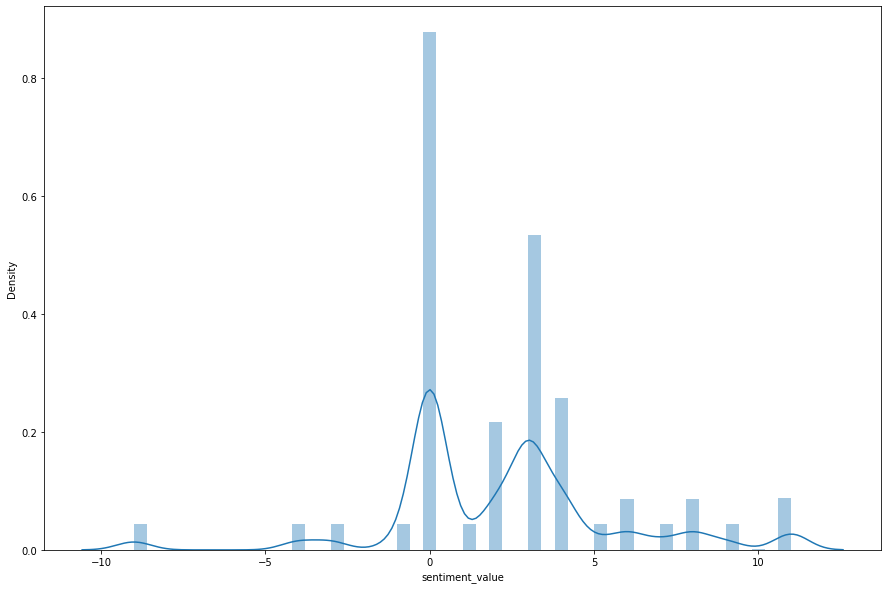

In [47]:
# Plotting the sentiment value for whole review
import seaborn as sns
plt.figure(figsize=(15,10))
sns.distplot(sent_df['sentiment_value'])

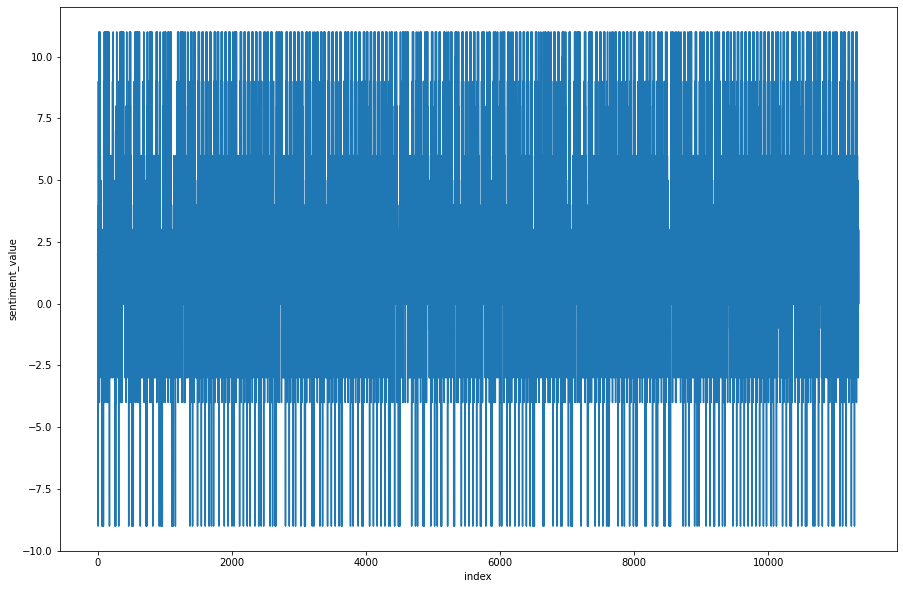

In [48]:
# Plotting the line plot for sentiment value of whole review
plt.figure(figsize=(15,10))
sns.lineplot(y='sentiment_value',x='index',data=sent_df)